# DM-23069-January-2020-ap_pipe-rerun

This is the ~monthly ap_pipe rerun of the HiTS 2015 dataset (all 3 fields). This rerun includes generating new templates as well as running ap_pipe.

### Results summary: It looks great, edge shenanigans notwithstanding!

Steps taken
* makeDiscreteSkyMap.py for HiTS 2014
* makeCoaddTempExp.py on HiTS 2014
* assembleCoadd.py on the result
* ap_pipe.py on HiTS 2015 with the newly assembled coadds as templates

The relevant repositories are on lsst-dev in /project/mrawls/hits2014/rerun/2020_01_coadds_full and /project/mrawls/hits2015/rerun/cw_2020_01.

I chose not to mess with `nImagesMax` in the `makeCoaddTempExp` step with `BestSeeingWcsSelectImagesTask` this time, and instead left it large (`1000`) as before. It does take a day or so to make new warps for all 3 fields with only 2 parallel processes, but this isn't presently prohibitive.

Instead, I adjusted `maxPsfFwhm=1.4` arcsec (again in `BestSeeingWcsSelectImagesTask`). This is because it was previously set too high (> 4), a value which would make sense if it were in pixels but was errantly allowing essentially all of the images to be selected rather than just some with better seeing than others.

There were no problems seen in the output, and the excess sources seen in the Dec 2019 rerun have disappeared.

I noted an **increase** in the total DIA Source count and a **decrease** in the good DIA source count, which is attributable to fewer visits comprising the templates. This results in (1) slightly greater chip gap template coverage in December than in January as well as (2) larger regions masked SENSOR_EDGE in December compared to January. These effects are visible in the plots in this notebook.

I recommend adopting these new templates for all our ap_verify HiTS datasets.

In [4]:
%matplotlib notebook
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import sqlite3
import importlib

import lsst.daf.persistence as dafPersist
import lsst.geom
import lsst.pipe.base as pipeBase

In [5]:
sys.path.append('/project/mrawls/ap_pipe-notebooks/')
from diaObjectAnalysis import loadAllApdbObjects, loadAllApdbSources, plotDiaObjectHistogram #, setObjectFilter
import plotLightcurve as plc  # in_ipynb, loadApdbObjects, loadApdbSources, patchFinder, plotLightcurve
from apdbPlots import makeSrcTableFlags

In [ ]:
# Only if you change anything in the code imported above
importlib.reload(plc)

In [6]:
def loadTables(repo, dbName='association.db', isVerify=False):
    butler = dafPersist.Butler(repo)
    if not isVerify:  # APDB is in repo (default)
        dbPath = os.path.abspath(os.path.join(repo, dbName))
    else:  # APDB is one level above repo
        repoUpOne = os.path.dirname(repo)
        dbPath = os.path.abspath(os.path.join(repoUpOne, dbName))
    objTable = loadAllApdbObjects(dbPath)
    srcTable = loadAllApdbSources(dbPath)
    flagTable, flagValues, srcTableFlags, flagFilter, noFlagFilter, \
    goodSrc, goodObj = makeSrcTableFlags(srcTable, objTable)
    return objTable, srcTable, goodObj, goodSrc

In [8]:
objTable1, srcTable1, goodObj1, goodSrc1 = loadTables('/project/mrawls/hits2015/rerun/cw_2019_12v2')  # Dec OK
objTable2, srcTable2, goodObj2, goodSrc2 = loadTables('/project/mrawls/hits2015/rerun/cw_2020_01')  # Jan

In [82]:
def plotHitsSourcesOnSky(srcTable, title=None, color='C0'):
    fig = plt.figure(figsize=(10, 8))
    ax1 = plt.subplot2grid((100, 100), (0, 55), rowspan=50, colspan=45)  # 1 single HiTS field, on the right
    ax2 = plt.subplot2grid((100, 100), (0, 0), rowspan=90, colspan=50)  # 2 overlapping HiTS fields, on the left

    ax1Filter = (srcTable['decl'] > -2)
    ax2Filter = (~ax1Filter)

    scatter1 = ax1.scatter(srcTable.loc[ax1Filter, 'ra'],
                           srcTable.loc[ax1Filter, 'decl'], 
                           c=color, s=2, alpha=0.2)
    scatter2 = ax2.scatter(srcTable.loc[ax2Filter, 'ra'], 
                           srcTable.loc[ax2Filter, 'decl'], 
                           c=color, s=2, alpha=0.2)

    ax1.set_xlabel('RA (deg)')
    ax2.set_xlabel('RA (deg)')
    ax1.set_ylabel('Dec (deg)')
    ax2.set_ylabel('Dec (deg)')

    ax1.spines['top'].set_visible(False)
    ax1.spines['left'].set_visible(False)
    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)
    ax1.invert_xaxis()
    ax2.invert_xaxis()

    ax1.yaxis.tick_right()
    ax1.yaxis.set_label_position('right')

    plt.subplots_adjust(wspace=0.1, hspace=0)

    if title is not None:
        plt.title(title)

<IPython.core.display.Javascript object>


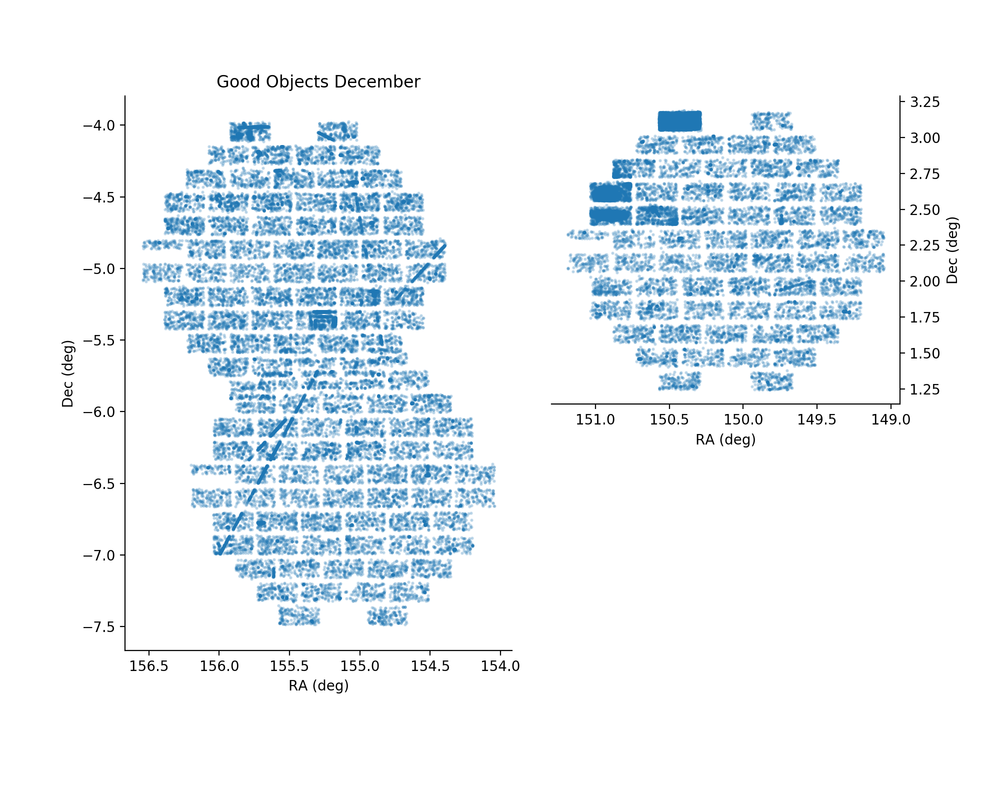

<IPython.core.display.Javascript object>


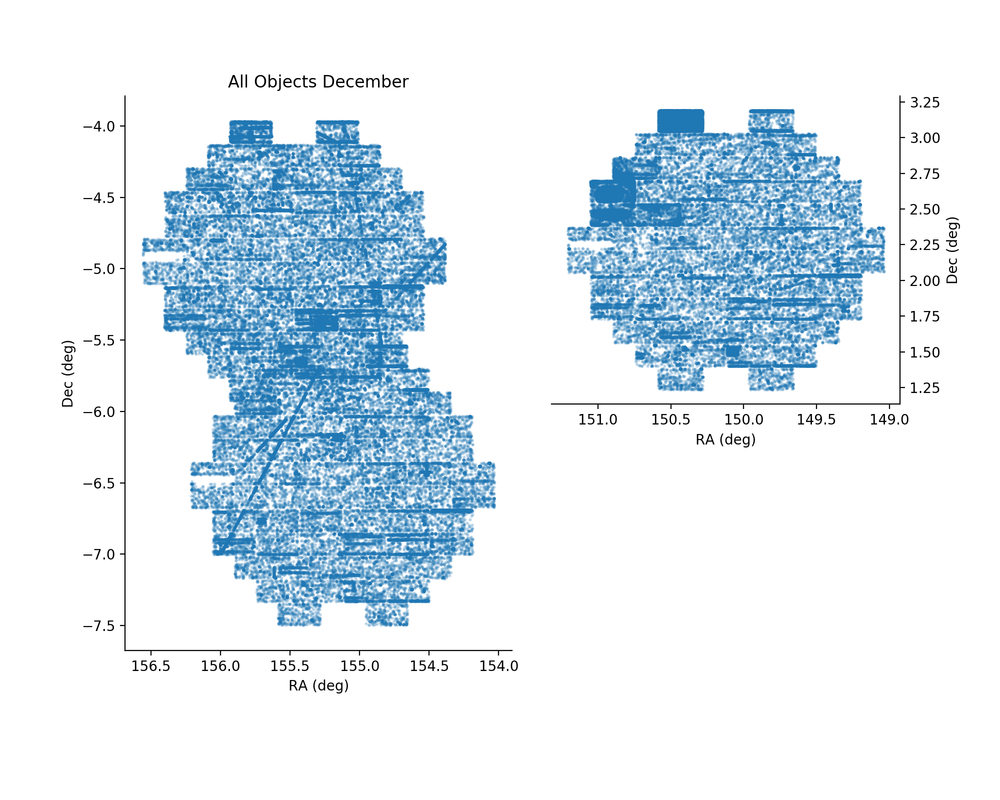

<IPython.core.display.Javascript object>


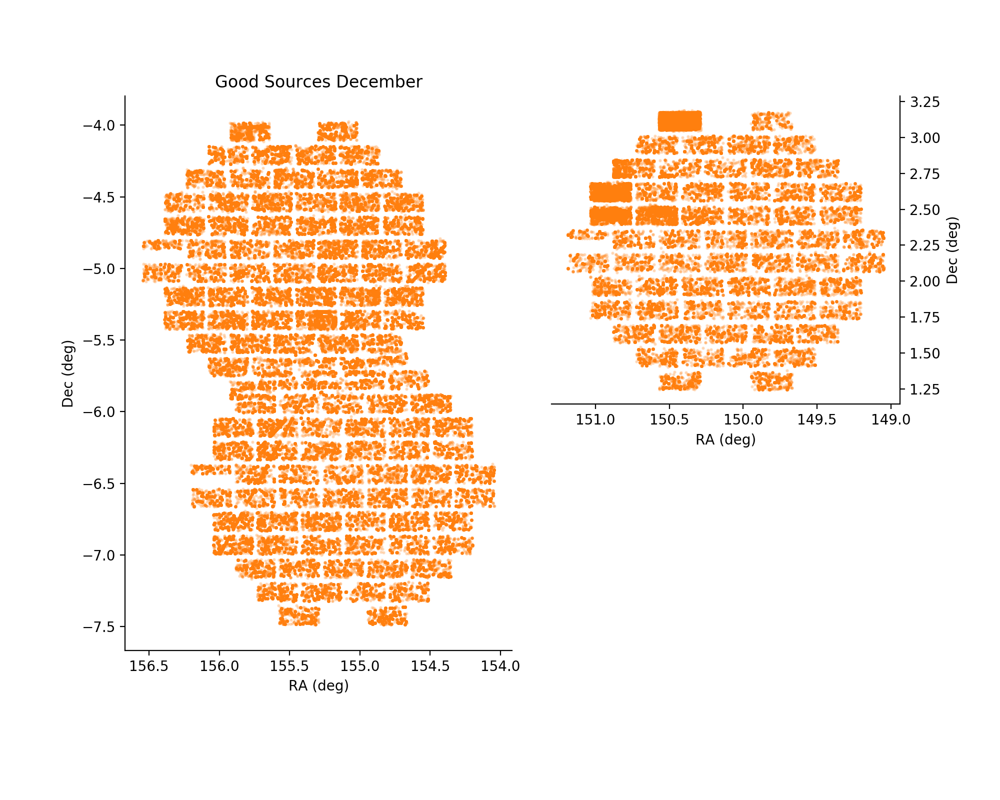

<IPython.core.display.Javascript object>


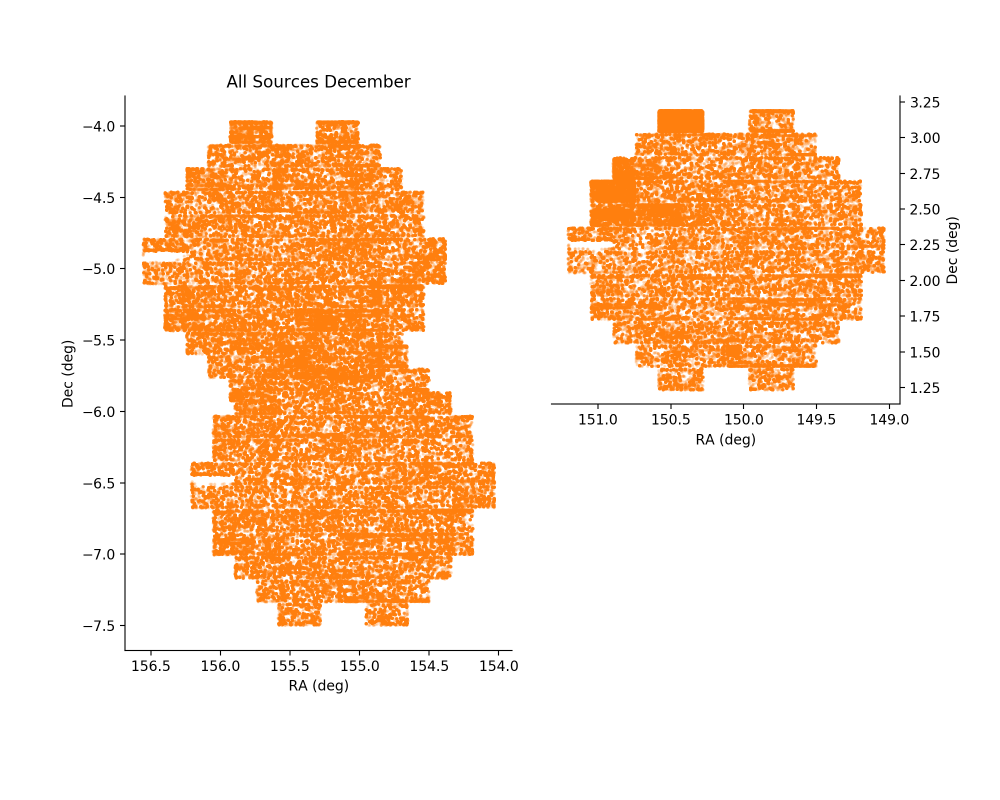

In [83]:
plotHitsSourcesOnSky(goodObj1, title='Good Objects December')
plotHitsSourcesOnSky(objTable1, title='All Objects December')
plotHitsSourcesOnSky(goodSrc1, title='Good Sources December', color='C1')
plotHitsSourcesOnSky(srcTable1, title='All Sources December', color='C1')

<IPython.core.display.Javascript object>


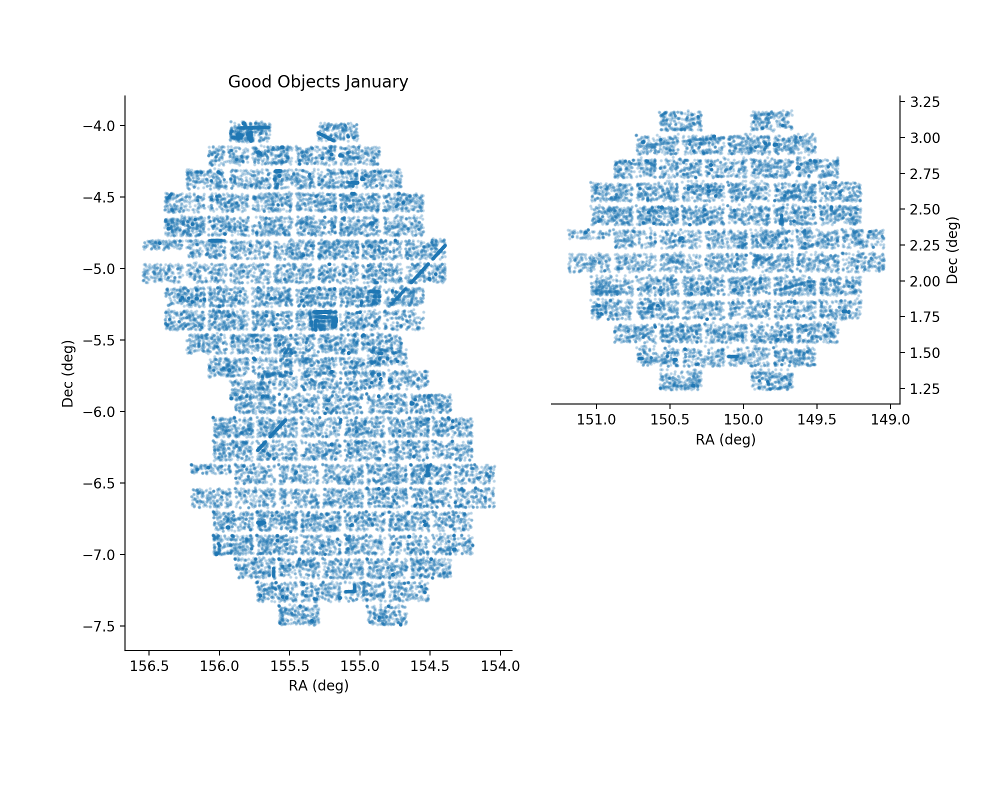

<IPython.core.display.Javascript object>


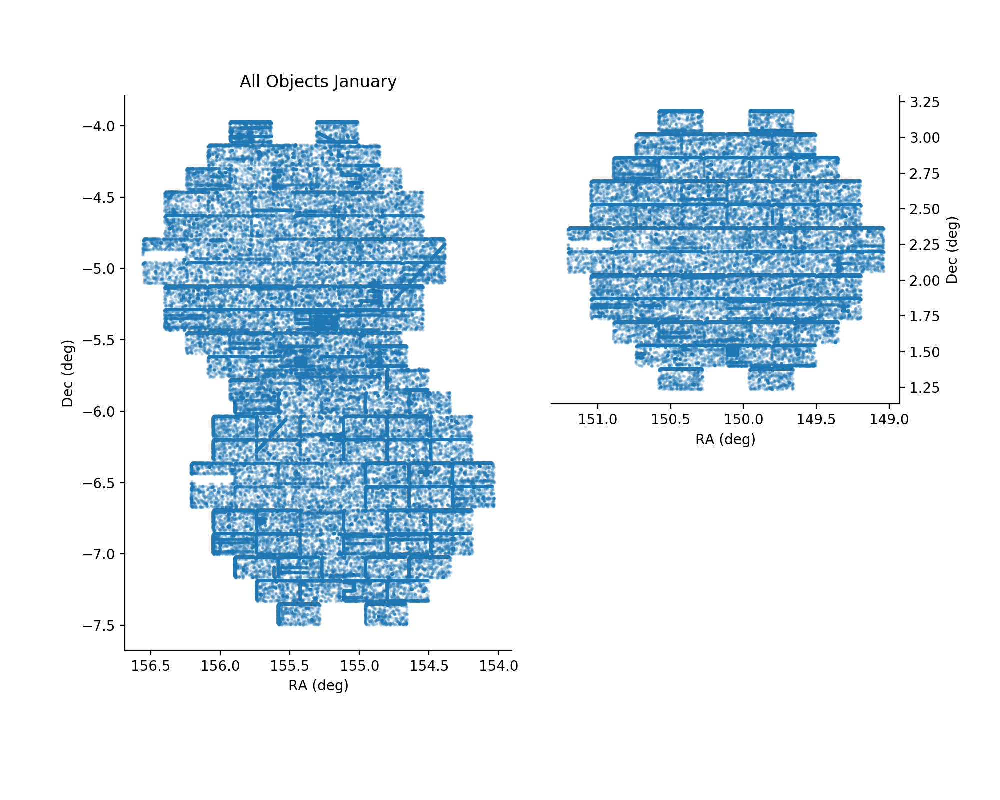

<IPython.core.display.Javascript object>


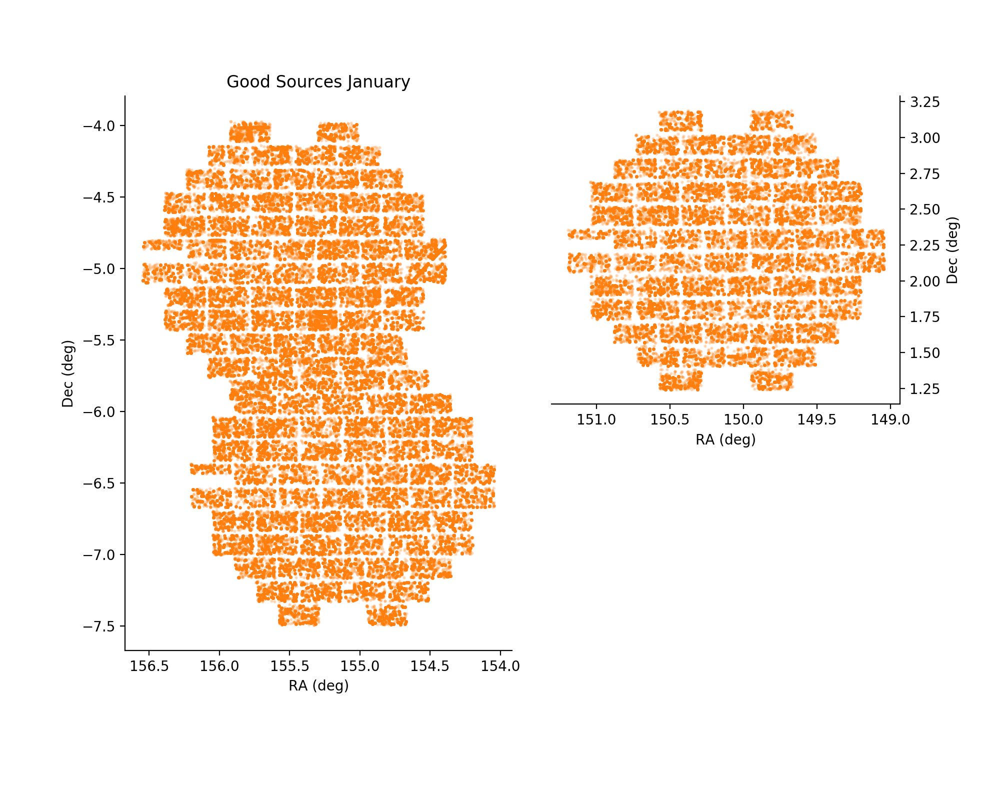

<IPython.core.display.Javascript object>


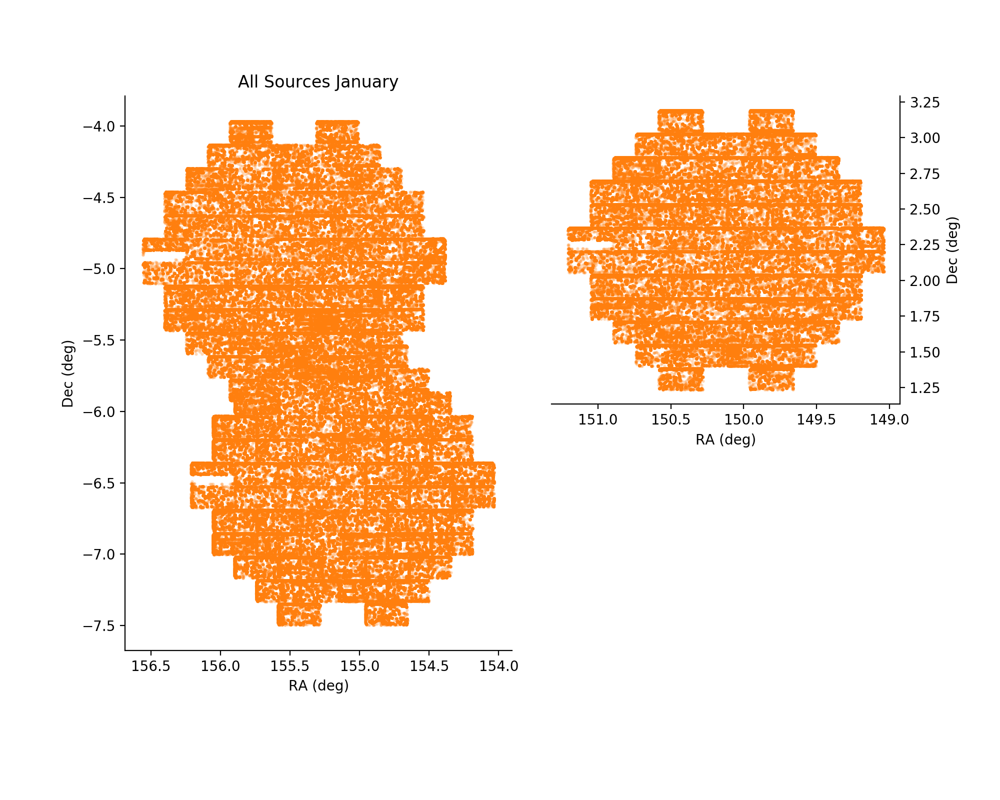

In [84]:
plotHitsSourcesOnSky(goodObj2, title='Good Objects January')
plotHitsSourcesOnSky(objTable2, title='All Objects January')
plotHitsSourcesOnSky(goodSrc2, title='Good Sources January', color='C1')
plotHitsSourcesOnSky(srcTable2, title='All Sources January', color='C1')

In [44]:
def getPatchConstituents(repo, printConstituents=False):
    """Learn which patches have data in them, and what dataIds (i.e., processed exposures) comprise each patch
    """
    dataIdSkymap = {'filter': 'g', 'tract': 0, 'patch': '0,0'}  # placeholder
    butler = dafPersist.Butler(repo)
    skymap = butler.get('deepCoadd_skyMap', dataId=dataIdSkymap)
    tractInfo = skymap[0]  # implicitly assumes there is just 1 tract
    everyPatchList = [str(patch.getIndex()[0]) + ',' + str(patch.getIndex()[1]) for patch in tractInfo]
    dataPatchList = []
    constituentList = []
    constituentCountList = []
    for patch in everyPatchList:
        try:
            dataIdPatch = {'filter': 'g', 'tract': 0, 'patch': patch}
            coadd_test = butler.get('deepCoadd', dataId=dataIdPatch)
            constituent = coadd_test.getInfo().getCoaddInputs().ccds['visit']
            constituentCount = len(constituent)
            if printConstituents:
                print(patch, constituentCount)#, constituent)
        except:
            #print('No data in this patch', patch)
            continue
        else:
            #print('This patch has a coadd', patch)
            dataPatchList.append(patch)
            constituentList.append(constituent)
            constituentCountList.append(constituentCount)
    return dataPatchList, constituentList, constituentCountList
    #fig = plt.figure(figsize=(7,7))
    #axes = fig.gca()
    #plotTractOutline(axes, tractInfo=skymap[0], patchList=dataPatchList, fontSize=6, maxDegBeyondPatch=0.1)
    #if title is not None:
    #    plt.title(title)

In [45]:
results1 = getPatchConstituents('/project/mrawls/hits2015/rerun/cw_2019_12v2', printConstituents=True)

13,4 21
14,4 21
15,4 21
16,4 21
12,5 42
13,5 105
14,5 105
15,5 85
16,5 105
17,5 42
11,6 42
12,6 105
13,6 126
14,6 126
15,6 85
16,6 126
17,6 105
18,6 42
11,7 63
12,7 126
13,7 126
14,7 126
15,7 105
16,7 126
17,7 126
18,7 63
11,8 43
12,8 85
13,8 84
14,8 84
15,8 63
16,8 84
17,8 84
18,8 42
11,9 41
12,9 125
13,9 147
14,9 147
15,9 105
16,9 126
17,9 105
18,9 42
11,10 21
12,10 105
13,10 168
14,10 168
15,10 126
16,10 105
17,10 42
10,11 21
11,11 84
12,11 126
13,11 147
14,11 147
15,11 126
16,11 63
9,12 21
10,12 63
11,12 126
12,12 126
13,12 126
14,12 126
15,12 126
16,12 84
17,12 22
9,13 42
10,13 63
11,13 126
12,13 126
13,13 126
14,13 126
15,13 126
16,13 105
17,13 42
10,14 42
11,14 84
12,14 84
13,14 84
14,14 84
15,14 84
16,14 42
10,15 20
11,15 84
12,15 126
13,15 126
14,15 126
15,15 105
16,15 42
11,16 21
12,16 63
13,16 63
14,16 63
15,16 42
30,34 21
31,34 21
32,34 21
33,34 21
29,35 21
30,35 84
31,35 105
32,35 105
33,35 105
34,35 42
35,35 1
28,36 5
29,36 59
30,36 118
31,36 118
32,36 118
33,36 118
34,36

In [47]:
results2 = getPatchConstituents('/project/mrawls/hits2015/rerun/cw_2020_01', printConstituents=True)

13,4 13
14,4 13
15,4 12
16,4 12
12,5 26
13,5 65
14,5 66
15,5 52
16,5 62
17,5 24
11,6 24
12,6 63
13,6 80
14,6 83
15,6 55
16,6 79
17,6 62
18,6 24
11,7 36
12,7 75
13,7 79
14,7 82
15,7 68
16,7 79
17,7 75
18,7 36
11,8 24
12,8 51
13,8 56
14,8 56
15,8 40
16,8 52
17,8 50
18,8 24
11,9 24
12,9 78
13,9 100
14,9 102
15,9 70
16,9 83
17,9 68
18,9 27
11,10 13
12,10 65
13,10 106
14,10 109
15,10 80
16,10 67
17,10 28
10,11 13
11,11 52
12,11 78
13,11 91
14,11 93
15,11 79
16,11 38
9,12 13
10,12 39
11,12 79
12,12 80
13,12 81
14,12 84
15,12 84
16,12 55
17,12 14
9,13 26
10,13 39
11,13 83
12,13 86
13,13 83
14,13 85
15,13 86
16,13 70
17,13 28
10,14 26
11,14 57
12,14 61
13,14 59
14,14 59
15,14 60
16,14 30
10,15 13
11,15 57
12,15 89
13,15 90
14,15 89
15,15 75
16,15 31
11,16 14
12,16 42
13,16 43
14,16 41
15,16 26
30,34 10
31,34 10
32,34 11
33,34 11
29,35 11
30,35 43
31,35 54
32,35 55
33,35 53
34,35 20
29,36 29
30,36 61
31,36 64
32,36 64
33,36 63
34,36 50
35,36 18
28,37 10
29,37 31
30,37 45
31,37 46
32,37 46
33,37

In [48]:
print(results1[2])

[21, 21, 21, 21, 42, 105, 105, 85, 105, 42, 42, 105, 126, 126, 85, 126, 105, 42, 63, 126, 126, 126, 105, 126, 126, 63, 43, 85, 84, 84, 63, 84, 84, 42, 41, 125, 147, 147, 105, 126, 105, 42, 21, 105, 168, 168, 126, 105, 42, 21, 84, 126, 147, 147, 126, 63, 21, 63, 126, 126, 126, 126, 126, 84, 22, 42, 63, 126, 126, 126, 126, 126, 105, 42, 42, 84, 84, 84, 84, 84, 42, 20, 84, 126, 126, 126, 105, 42, 21, 63, 63, 63, 42, 21, 21, 21, 21, 21, 84, 105, 105, 105, 42, 1, 5, 59, 118, 118, 118, 118, 97, 38, 29, 67, 92, 92, 92, 92, 92, 47, 20, 48, 103, 124, 124, 124, 125, 123, 63, 39, 10, 63, 125, 125, 125, 124, 103, 41, 21, 80, 100, 100, 99, 40, 24, 28, 29, 29, 3]


In [49]:
print(results2[2])

[13, 13, 12, 12, 26, 65, 66, 52, 62, 24, 24, 63, 80, 83, 55, 79, 62, 24, 36, 75, 79, 82, 68, 79, 75, 36, 24, 51, 56, 56, 40, 52, 50, 24, 24, 78, 100, 102, 70, 83, 68, 27, 13, 65, 106, 109, 80, 67, 28, 13, 52, 78, 91, 93, 79, 38, 13, 39, 79, 80, 81, 84, 84, 55, 14, 26, 39, 83, 86, 83, 85, 86, 70, 28, 26, 57, 61, 59, 59, 60, 30, 13, 57, 89, 90, 89, 75, 31, 14, 42, 43, 41, 26, 10, 10, 11, 11, 11, 43, 54, 55, 53, 20, 29, 61, 64, 64, 63, 50, 18, 10, 31, 45, 46, 46, 46, 43, 20, 9, 20, 51, 66, 66, 66, 66, 61, 28, 18, 33, 66, 66, 66, 66, 53, 20, 11, 39, 50, 49, 48, 21, 8, 9, 8, 8, 1]


In [50]:
print(len(results1[2]), len(results2[2]))

149 146


<IPython.core.display.Javascript object>


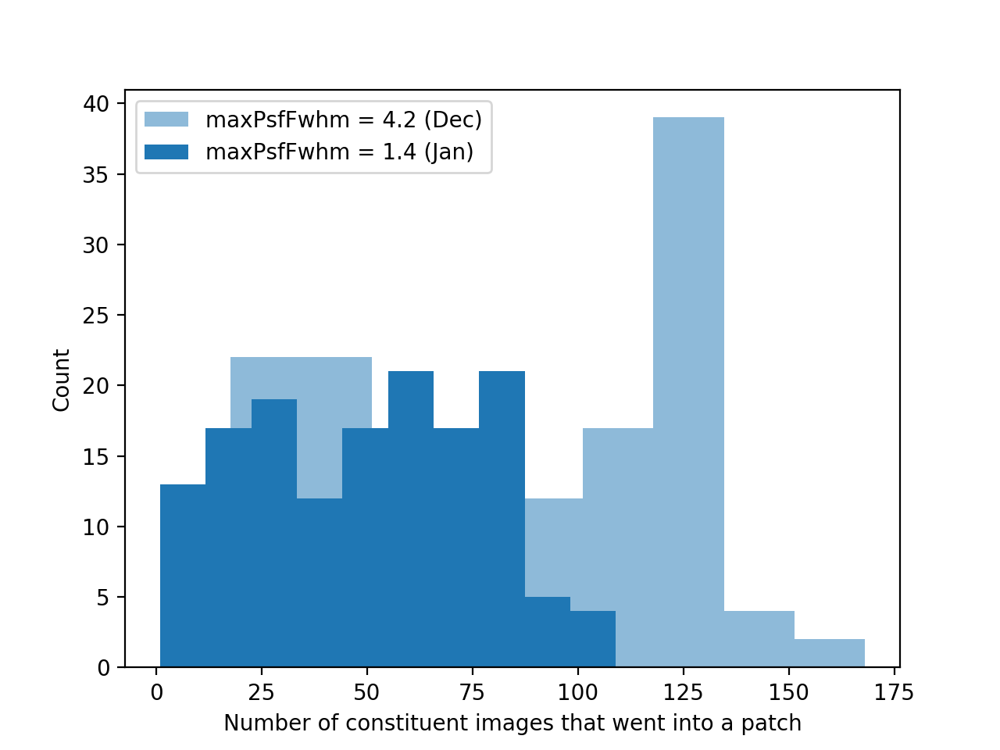

In [113]:
plt.figure()
plt.hist(results1[2], label='maxPsfFwhm = 4.2 (Dec)', color='C0', alpha=0.5)
plt.hist(results2[2], label='maxPsfFwhm = 1.4 (Jan)', color='C0')
plt.xlabel('Number of constituent images that went into a patch')
plt.ylabel('Count')
plt.legend()

In [60]:
print(len(goodSrc1), len(goodSrc2))  # "good" source count for December and January, respectively

252148 219233


In [61]:
print(len(srcTable1), len(srcTable2))  # total source count for December and January, respectively

528582 634915


In [69]:
print(len(goodObj1), len(goodObj2))  # "good" object count for December and January, respectively

66304 48337


In [71]:
print(len(objTable1), len(objTable2))  # total object count for December and January, respectively

138736 178180


<IPython.core.display.Javascript object>


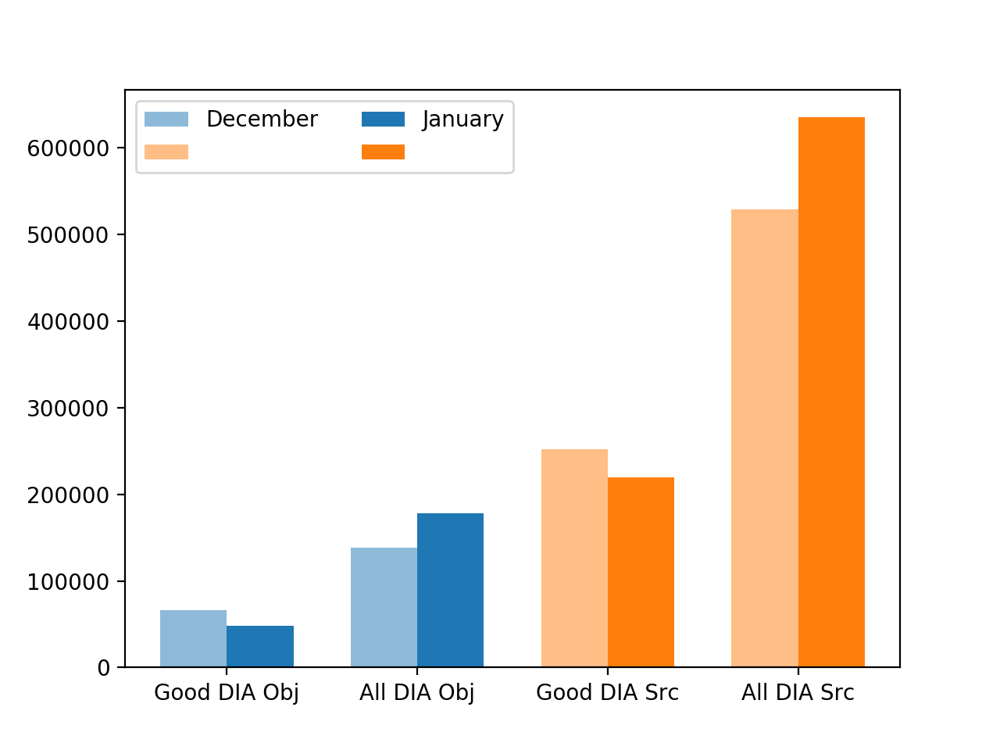

[Text(0, 0, 'Good DIA Obj'),
 Text(0, 0, 'All DIA Obj'),
 Text(0, 0, 'Good DIA Src'),
 Text(0, 0, 'All DIA Src')]

In [109]:
fig, ax = plt.subplots()
barLabels = ['Good DIA Obj', 'All DIA Obj', 'Good DIA Src', 'All DIA Src']
xbar = np.array([0, 1])
width = 0.35

# December
ax.bar(xbar - width/2, [len(goodObj1), len(objTable1)], 
       width, label='December', color='C0', alpha=0.5)
ax.bar(xbar + 2 - width/2, [len(goodSrc1), len(srcTable1)],
       width, label=' ', color='C1', alpha=0.5)

# January
ax.bar(xbar + width/2, [len(goodObj2), len(objTable2)], 
       width, label='January', color='C0')
ax.bar(xbar + 2 + width/2, [len(goodSrc2), len(srcTable2)],
       width, label=' ', color='C1')

plt.legend(ncol=2)
ax.set_xticks([0, 1, 2, 3])
ax.set_xticklabels(barLabels)

In [75]:
testId = {'visit': 410987, 'ccd': 13}
repo1 = '/project/mrawls/hits2015/rerun/cw_2019_12v2'
butler1 = dafPersist.Butler(repo1)
diffIm1 = butler1.get('deepDiff_differenceExp', dataId=testId)
repo2 = '/project/mrawls/hits2015/rerun/cw_2020_01'
butler2 = dafPersist.Butler(repo2)
diffIm2 = butler2.get('deepDiff_differenceExp', dataId=testId)

In [76]:
import lsst.afw.display as afwDisplay
afwDisplay.setDefaultBackend('matplotlib')

<IPython.core.display.Javascript object>


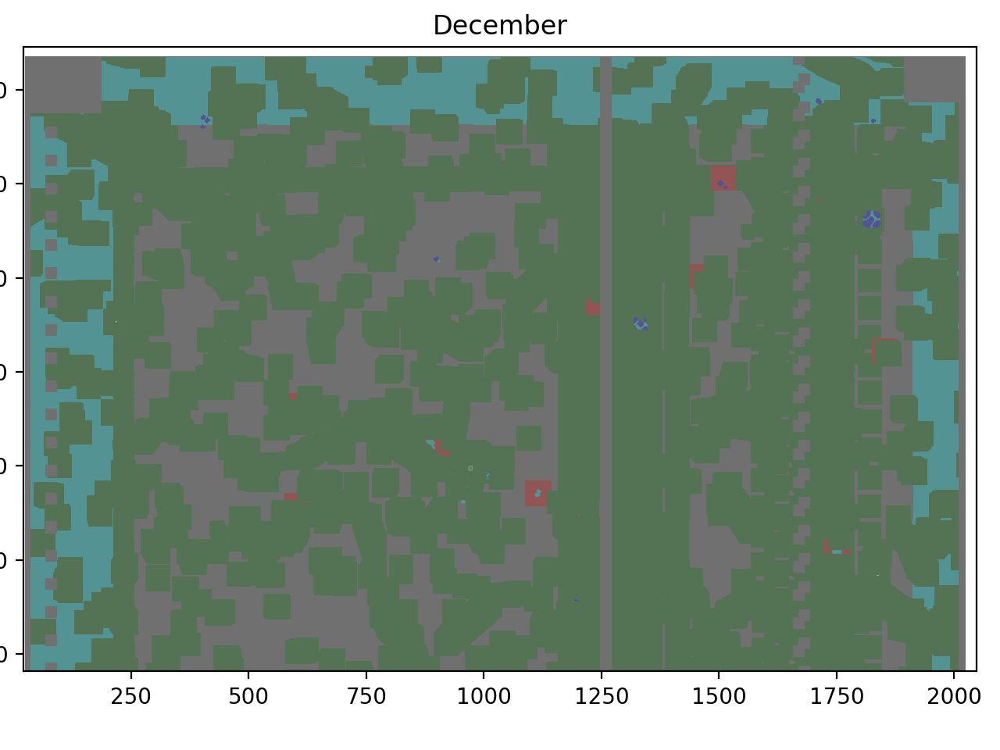

Text(0.5, 1.0, 'December')

In [114]:
disp1 = afwDisplay.Display(30)
disp1.mtv(diffIm1)
plt.title('December')

/opt/lsst/software/stack/python/miniconda3-4.7.10/envs/lsst-scipipe-4d7b902/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


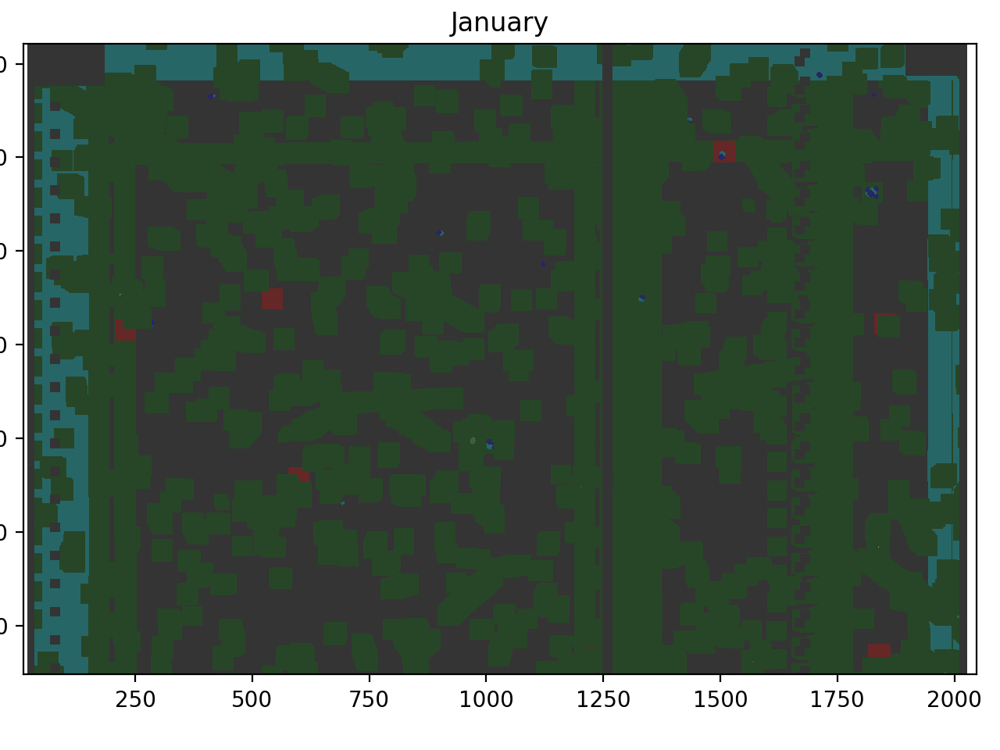

Text(0.5, 1.0, 'January')

In [115]:
disp2 = afwDisplay.Display(31)
disp2.mtv(diffIm2)
plt.title('January')